# Evaluation Project 10: Insurance Fraud Detection

# Insurance Fraud Detection is a classification based problem statement to predict if applicant can be fraudulent, it also strives to study and generate as many insights as as possible. The dataset includes details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

# Importing Data From Github repository dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv

# Importing Required Libraries And Data

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv',parse_dates=True)
data

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


# The above table represents first five rows and last 5 rows of the dataset.

In [16]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  1000 Number Of Columns:  40


# Data Cleaning

In [17]:
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

# The above cell displays all the column names in the dataset.

In [18]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [19]:
data.isna().any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                 False
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

In [20]:
data.isna().values.any()

True

In [21]:
data.isnull().values.sum()

1000

# The above cells calculated number of missing values to be 1000.

# Handling Of Missing Data

In [22]:
data=data.fillna(0)
data.isna().values.any(), data.isnull().values.sum()

(False, 0)

In [23]:
data.dtypes, len(data.dtypes)

(months_as_customer               int64
 age                              int64
 policy_number                    int64
 policy_bind_date                object
 policy_state                    object
 policy_csl                      object
 policy_deductable                int64
 policy_annual_premium          float64
 umbrella_limit                   int64
 insured_zip                      int64
 insured_sex                     object
 insured_education_level         object
 insured_occupation              object
 insured_hobbies                 object
 insured_relationship            object
 capital-gains                    int64
 capital-loss                     int64
 incident_date                   object
 incident_type                   object
 collision_type                  object
 incident_severity               object
 authorities_contacted           object
 incident_state                  object
 incident_city                   object
 incident_location               object


In [33]:
data['collision_type']=np.where(data['collision_type']=='?', 'Front Collision', data['collision_type'])
data['property_damage']=np.where(data['property_damage']=='?', 'YES', data['property_damage'])
data['police_report_available']=np.where(data['police_report_available']=='?', 'YES', data['police_report_available'])
data

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,0.0
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,YES,5070,780,780,3510,Mercedes,E400,2007,Y,0.0
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,0.0
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,0.0
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,YES,87200,17440,8720,61040,Honda,Accord,2006,N,0.0
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,YES,108480,18080,18080,72320,Volkswagen,Passat,2015,N,0.0
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,0.0
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,0.0


# Tabulated Conclusion Of Data Cleaning

In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
1. The dataset has no missing values, therefore imputation and filling data are not required.
2. The whole dataset is of 1000 rows * 40 columns, hence, chances of underfitting, that is, model getting trained less than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 19 continuous columns and 21 categorical columns, hence, encoding is not required.

# Dataset Visualization                                                                                                     

# Head View

In [35]:
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,0.0
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,YES,5070,780,780,3510,Mercedes,E400,2007,Y,0.0
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,0.0
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,0.0
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,0.0


# The above table represents first five rows of original dataset

# Sample View

In [36]:
data.sample()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
688,290,47,885789,21-07-2008,IN,250/500,1000,1393.34,0,472922,...,YES,56160,6240,12480,37440,Audi,A5,2002,N,0.0


# The above table represents a random row as sample row from the dataset

# Tail View

In [37]:
data.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,YES,87200,17440,8720,61040,Honda,Accord,2006,N,0.0
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,YES,108480,18080,18080,72320,Volkswagen,Passat,2015,N,0.0
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,0.0
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,0.0
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,YES,5060,460,920,3680,Mercedes,E400,2007,N,0.0


# The above table represents last five rows of the dataframe.

# EDA

In [38]:
import plotly.express as px
for x in data.select_dtypes(object).columns:
    if x=='policy_bind_date' or x=='incident_date' or x=='incident_location':
        fig = px.bar(data, y=x)
        fig.show()
    else:
        fig=px.pie(data,x,title=x)
        fig.show()

# Tabulated Analysis Of Above Countplots

In [39]:
object_description=data.select_dtypes(object).describe()
object_description=object_description.rename(index={'count':'count of values', 'unique':'unique values', 'top':'most frequent value', 'freq':'frequency of most frequent value'})
dict1=object_description.iloc[0,:]-object_description.iloc[3,:]
object_description1=pd.concat([object_description, pd.DataFrame(dict1).T])
object_description1=object_description1.rename(index={0:'count of remaining values'})
object_description1

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,...,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count of values,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique values,951,3,3,2,7,14,20,6,60,4,...,4,5,7,7,1000,2,2,14,39,2
most frequent value,01-01-2006,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,...,Minor Damage,Police,NY,Springfield,9935 4th Drive,YES,YES,Saab,RAM,N
frequency of most frequent value,3,352,351,537,161,93,64,183,28,419,...,354,292,262,157,1,662,657,80,43,753
count of remaining values,997,648,649,463,839,907,936,817,972,581,...,646,708,738,843,999,338,343,920,957,247


# Verbal Translation Of Above Table

# Unique Values Of All Columns With Object Values (Exclusing Loan Id, that has all unique values)

In [16]:
colist=data.select_dtypes(object).columns
len(colist)

21

# 1. There are 21 object columns.

# Many columns have more than 2 unique values and are arranged in cell above:
    Rows 3, 4 and 5 explain the most frequent value and its count and data portion occupied by other unique values.

# For example, there are 951 unique values in policy bind date.
    
# 1. There are 21 object columns, of which 3 are spread across yes and no:
        
        i. Of 1000 cases, 753 (75.3%) were not reported as fraud and 247 cases were reported as fraud.
        
        ii. Of 1000 cases 657 (65.7%) police report are available and 343 police report are not available.
        
        iii. Of 1000 cases 662 (66.2%) property damage were reported and 338 property damage was not reported.

    
#  We will understand the data by drawing anomalies and understanding their behaviour at times of fraud.

 ##  Of 75.3% fraud not reported 2.43% were escape (these should be treated as vulnerable and moral hazard cases).

##  Maximum insured own saab, dodge and suburu.

##  Maximum incidents took place in Springfield
    

    
# Q&A Answered

### How many customers are being surveyed: 1000

### What is the most popular incident state: New York

### How many authorities were contacted: 5; police, ambulance, fire, other and none (Majority=29.2% times police was contacted).

# Tabulated Conclusion Of Data Cleaning

In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
### The dataset has no missing values, therefore imputation and filling data are not required.
### The whole dataset is of 1000 rows*40 columns, hence, chances of underfitting, that is, model getting trained less than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
### There are 19 continuous columns and 21 categorical columns, hence, encoding is required.

# Feature Engineering

# Encoding

In [41]:
data.select_dtypes(object).columns

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

# Encoding Of All Other Object Columns With Ordinal Encoder (8 such columns)

In [42]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,policy_bind_date_encoded,policy_state_encoded,policy_csl_encoded,insured_sex_encoded,insured_education_level_encoded,insured_occupation_encoded,insured_hobbies_encoded,insured_relationship_encoded,incident_date_encoded,incident_type_encoded,...,incident_severity_encoded,authorities_contacted_encoded,incident_state_encoded,incident_city_encoded,incident_location_encoded,property_damage_encoded,police_report_available_encoded,auto_make_encoded,auto_model_encoded,fraud_reported_encoded
0,532.0,2.0,1.0,1.0,4.0,2.0,17.0,0.0,49.0,2.0,...,0.0,4.0,4.0,1.0,996.0,1.0,1.0,10.0,1.0,1.0
1,821.0,1.0,1.0,1.0,4.0,6.0,15.0,2.0,41.0,3.0,...,1.0,4.0,5.0,5.0,628.0,1.0,1.0,8.0,12.0,1.0
2,186.0,2.0,0.0,0.0,6.0,11.0,2.0,3.0,44.0,0.0,...,1.0,4.0,1.0,1.0,685.0,0.0,0.0,4.0,30.0,0.0
3,766.0,0.0,1.0,0.0,6.0,1.0,2.0,4.0,19.0,2.0,...,0.0,4.0,2.0,0.0,669.0,1.0,0.0,3.0,34.0,1.0
4,181.0,0.0,2.0,1.0,0.0,11.0,2.0,4.0,34.0,3.0,...,1.0,2.0,1.0,0.0,220.0,0.0,0.0,0.0,31.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,487.0,2.0,2.0,0.0,5.0,2.0,13.0,4.0,44.0,2.0,...,1.0,1.0,0.0,4.0,561.0,1.0,1.0,6.0,6.0,0.0
996,129.0,0.0,0.0,0.0,6.0,9.0,17.0,5.0,47.0,2.0,...,0.0,1.0,4.0,3.0,227.0,1.0,1.0,13.0,28.0,0.0
997,509.0,2.0,1.0,0.0,5.0,1.0,3.0,2.0,45.0,0.0,...,1.0,4.0,0.0,0.0,746.0,1.0,1.0,11.0,19.0,0.0
998,573.0,0.0,2.0,1.0,0.0,5.0,0.0,5.0,52.0,2.0,...,0.0,3.0,1.0,0.0,569.0,1.0,1.0,1.0,5.0,0.0


# Comparison Of Encoded Column And Original Column ('Loan Status')

In [43]:
encoded_data['fraud_reported_encoded'].unique()

array([1., 0.])

In [44]:
data['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

# Conclusion
Y is encoded as 1 and N is encoded as 0 

# Concatenating Encoded Data With Original Data

In [45]:
data=pd.concat([data, encoded_data], axis=1, ignore_index=False)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded,authorities_contacted_encoded,incident_state_encoded,incident_city_encoded,incident_location_encoded,property_damage_encoded,police_report_available_encoded,auto_make_encoded,auto_model_encoded,fraud_reported_encoded
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,...,0.0,4.0,4.0,1.0,996.0,1.0,1.0,10.0,1.0,1.0
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,...,1.0,4.0,5.0,5.0,628.0,1.0,1.0,8.0,12.0,1.0
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,...,1.0,4.0,1.0,1.0,685.0,0.0,0.0,4.0,30.0,0.0
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,...,0.0,4.0,2.0,0.0,669.0,1.0,0.0,3.0,34.0,1.0
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,...,1.0,2.0,1.0,0.0,220.0,0.0,0.0,0.0,31.0,0.0


In [46]:
data1=data.pct_change()
data1.columns=data1.columns+'_pct_change'
data1

,months_as_customer_pct_change,age_pct_change,policy_number_pct_change,policy_deductable_pct_change,policy_annual_premium_pct_change,umbrella_limit_pct_change,insured_zip_pct_change,capital-gains_pct_change,capital-loss_pct_change,incident_hour_of_the_day_pct_change,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.304878,-0.125000,-0.342642,1.0,-0.149043,inf,0.004385,-1.000000,NaN,0.600000,...,inf,0.000000,0.25,4.000000,-0.369478,0.0,0.0,-0.200000,11.000000,0.0
2,-0.412281,-0.309524,1.005722,0.0,0.180351,0.000000,-0.080192,inf,NaN,-0.125000,...,0.0,0.000000,-0.80,-0.800000,0.090764,-1.0,-1.0,-0.500000,1.500000,-1.0
3,0.910448,0.413793,-0.668734,0.0,0.001840,0.200000,0.412150,0.393162,-inf,-0.285714,...,-1.0,0.000000,1.00,-1.000000,-0.023358,inf,NaN,-0.250000,0.133333,inf
4,-0.109375,0.073171,0.612982,-0.5,0.118786,0.000000,0.004257,0.349693,-0.262821,3.000000,...,inf,-0.500000,-0.50,NaN,-0.671151,-1.0,NaN,-1.000000,-0.088235,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.978723,0.266667,0.382055,0.0,-0.026903,NaN,0.001449,NaN,-1.000000,2.333333,...,0.0,-0.500000,-1.00,0.333333,-0.087805,0.0,0.0,0.000000,-0.400000,NaN
996,94.000000,0.078947,-0.801525,0.0,0.096117,NaN,0.410138,inf,NaN,0.150000,...,-1.0,0.000000,inf,-0.250000,-0.595365,0.0,0.0,1.166667,3.666667,NaN
997,-0.543860,-0.170732,3.913584,-0.5,-0.037097,inf,-0.271927,-0.504937,NaN,-0.826087,...,inf,3.000000,-1.00,-1.000000,2.286344,0.0,0.0,-0.153846,-0.321429,NaN
998,2.523077,0.823529,-0.418693,3.0,-0.019205,0.666667,-0.002446,-1.000000,NaN,-0.500000,...,-1.0,-0.250000,inf,NaN,-0.237265,0.0,0.0,-0.909091,-0.736842,NaN


In [47]:
data=pd.concat([data, data1], axis=1)
data

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,...,inf,0.000000,0.25,4.000000,-0.369478,0.0,0.0,-0.200000,11.000000,0.0
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,...,0.0,0.000000,-0.80,-0.800000,0.090764,-1.0,-1.0,-0.500000,1.500000,-1.0
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,...,-1.0,0.000000,1.00,-1.000000,-0.023358,inf,NaN,-0.250000,0.133333,inf
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,...,inf,-0.500000,-0.50,NaN,-0.671151,-1.0,NaN,-1.000000,-0.088235,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1000,1310.80,0,431289,0,0,20,...,0.0,-0.500000,-1.00,0.333333,-0.087805,0.0,0.0,0.000000,-0.400000,NaN
996,285,41,186934,1000,1436.79,0,608177,70900,0,23,...,-1.0,0.000000,inf,-0.250000,-0.595365,0.0,0.0,1.166667,3.666667,NaN
997,130,34,918516,500,1383.49,3000000,442797,35100,0,4,...,inf,3.000000,-1.00,-1.000000,2.286344,0.0,0.0,-0.153846,-0.321429,NaN
998,458,62,533940,2000,1356.92,5000000,441714,0,0,2,...,-1.0,-0.250000,inf,NaN,-0.237265,0.0,0.0,-0.909091,-0.736842,NaN


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [48]:
final_dataframe=data.copy()

In [49]:
final_dataframe.isna().values.any()

True

In [50]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

In [51]:
final_dataframe[np.isinf(final_dataframe)] = 0

# There are no null and missing values in final dataframe.

# EDA Part 1

In [52]:
final_dataframe[:10]

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
0,328,48,521585,1000,1406.91,0,466132,53300,0,5,...,0.0,0.00,0.00,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0
1,228,42,342868,2000,1197.22,5000000,468176,0,0,8,...,0.0,0.00,0.25,4.000000,-0.369478,0.0,0.0,-0.200000,11.000000,0.0
2,134,29,687698,2000,1413.14,5000000,430632,35100,0,7,...,0.0,0.00,-0.80,-0.800000,0.090764,-1.0,-1.0,-0.500000,1.500000,-1.0
3,256,41,227811,2000,1415.74,6000000,608117,48900,-62400,5,...,-1.0,0.00,1.00,-1.000000,-0.023358,0.0,0.0,-0.250000,0.133333,0.0
4,228,44,367455,1000,1583.91,6000000,610706,66000,-46000,20,...,0.0,-0.50,-0.50,0.000000,-0.671151,-1.0,0.0,-1.000000,-0.088235,-1.0
5,256,39,104594,1000,1351.10,0,478456,0,0,19,...,-1.0,-0.50,3.00,0.000000,3.050000,0.0,0.0,0.000000,-0.903226,0.0
6,137,34,413978,1000,1333.35,0,441716,0,-77000,0,...,0.0,3.00,-0.75,0.000000,-0.395062,0.0,0.0,-0.100000,8.666667,-1.0
7,165,37,429027,1000,1137.03,0,603195,0,0,23,...,1.0,0.00,4.00,-0.833333,-0.487941,0.0,0.0,-0.888889,-0.827586,0.0
8,27,33,485665,500,1442.99,0,601734,0,0,21,...,0.0,0.00,0.20,-1.000000,0.554348,-1.0,0.0,11.000000,0.800000,0.0
9,212,42,636550,500,1315.68,0,600983,0,-39300,14,...,0.0,-0.25,-1.00,0.000000,-0.477855,0.0,0.0,-0.166667,-0.888889,0.0


# The above table represents first 10 rows from final dataframe.

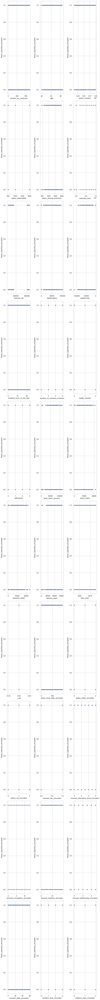

In [53]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(colist[x], y='fraud_reported_encoded', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that distribution is mostly evenly distributed for most of the columns. For example, 

## months as customer

## age

## policy numbrt

## policy deductable

## policy annual premium


# Anomalies Detected

## Fraud Reported: Y is encoded as 1 and N is encoded as 0

# Higher instances of moral hazard can be detected from these patterns:

## Fraud reported is equally spread between yes and no points for alll the 3 collision types

## People with lower vehicle claim have less fraud reported.

## People with higher property claim have more loss reported.

# Q&A Answered

## Range of policy deductibe: 500 to 2000

## Range of policy annual premium: 0 to 2500

## Range of umbrella limit: 0 to 1

## Range of number of vehicles involved: 1 to 4

# Value Count Of fraud reported and not reported cases.

In [54]:
data['fraud_reported_encoded'].value_counts()

0.0    753
1.0    247
Name: fraud_reported_encoded, dtype: int64

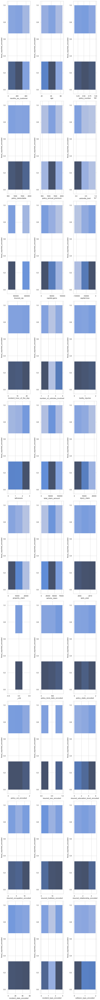

In [55]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='fraud_reported_encoded', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

# The above histograms show frequency distribution of features against label. It is divided into 3 bins. 
['capital-loss', 'incident_hour_of_the_day', 'total_claim_amount',
       'vehicle_claim', 'auto_year', 'policy_state_encoded',
       'insured_education_level_encoded', 'insured_occupation_encoded',
       'insured_hobbies_encoded', 'authorities_contacted_encoded',
       'incident_state_encoded', 'property_damage_encoded',
       'police_report_available_encoded', 'auto_make_encoded',
       'auto_model_encoded'] show left skewness. 
       
       Right skewness is found in: 
       ['months_as_customer', 'age', 'policy_number', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'number_of_vehicles_involved', 'bodily_injuries',
       'witnesses', 'injury_claim', 'property_claim',
       'policy_bind_date_encoded', 'policy_csl_encoded', 'insured_sex_encoded',
       'insured_relationship_encoded', 'incident_date_encoded',
       'incident_type_encoded', 'collision_type_encoded',
       'incident_severity_encoded', 'incident_city_encoded',
       'fraud_reported_encoded', 'age_pct_change', 'policy_number_pct_change',
       'policy_deductable_pct_change', 'policy_annual_premium_pct_change',
       'insured_zip_pct_change', 'number_of_vehicles_involved_pct_change',
       'total_claim_amount_pct_change', 'vehicle_claim_pct_change',
       'auto_year_pct_change']
# Many datapoints, 
['months_as_customer', 'age', 'policy_number', 'policy_deductable',
       'policy_annual_premium', 'capital-gains', 'capital-loss',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_year', '_c39',
       'policy_bind_date_encoded', 'policy_state_encoded',
       'policy_csl_encoded', 'insured_sex_encoded',
       'insured_education_level_encoded', 'insured_occupation_encoded',
       'insured_hobbies_encoded', 'insured_relationship_encoded',
       'incident_date_encoded', 'incident_type_encoded',
       'collision_type_encoded', 'incident_severity_encoded',
       'authorities_contacted_encoded', 'incident_state_encoded',
       'incident_city_encoded', 'incident_location_encoded',
       'auto_make_encoded', 'auto_model_encoded', 'insured_zip_pct_change',
       'auto_year_pct_change'] seem to be close to normal with skewness threshold within +/-0.65.
# 2 columns have 0 skewness (as desired in normal distribution):
## ['_c39', 'incident_location_encoded']

# Correlation Analysis

In [63]:
final_dataframe.corr()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,...,-0.044535,-0.001252,0.010422,0.016130,0.035411,-0.004836,-0.052748,0.046953,0.000862,-0.047563
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,...,-0.034505,-0.017087,0.009374,0.014936,0.042304,-0.007261,-0.035614,0.050041,0.008496,-0.028974
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,...,0.028767,0.054312,-0.003648,-0.037653,0.014570,-0.022651,-0.055912,0.057736,0.008277,-0.000267
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,...,-0.004817,-0.043006,0.025165,-0.036986,-0.029145,-0.040724,0.033196,-0.043449,-0.018497,-0.033658
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,...,-0.039681,-0.027059,0.007188,0.051420,0.031911,-0.001170,-0.003051,0.028476,0.037799,-0.021692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
property_damage_encoded_pct_change,-0.004836,-0.007261,-0.022651,-0.040724,-0.001170,-0.046174,-0.049120,-0.047307,0.015782,0.017199,...,-0.067710,-0.011354,0.009408,0.006882,0.048833,1.000000,0.049397,-0.029619,-0.012351,0.084051
police_report_available_encoded_pct_change,-0.052748,-0.035614,-0.055912,0.033196,-0.003051,-0.004571,0.018407,0.016802,-0.076890,0.013207,...,-0.010536,0.017325,0.068020,0.025638,0.037886,0.049397,1.000000,0.005251,0.000476,0.023423
auto_make_encoded_pct_change,0.046953,0.050041,0.057736,-0.043449,0.028476,0.012887,0.028342,-0.028868,-0.036159,0.032527,...,-0.050912,0.006992,-0.021334,0.003473,-0.004255,-0.029619,0.005251,1.000000,0.001291,-0.038985
auto_model_encoded_pct_change,0.000862,0.008496,0.008277,-0.018497,0.037799,0.028191,-0.013360,0.015962,-0.000947,-0.016711,...,0.006701,0.014272,-0.024217,-0.006698,-0.023206,-0.012351,0.000476,0.001291,1.000000,0.002359


# The above table represents correlation among dataset. There seems some multicollinearity due to presence of Injury Claim and vehiclile claim,injury claim and property claim; month as a customer and age; policy number and month as custmer; ploicy number and age; witness and vehiclile claim; witness and property claim; witness and injury claim; incident type conded; and their percentage translation that show strong correlation among each other. Other  than these columns there seems modest collinearity among features. We will do further eda before arriving at a conclusion to delete these columns.

# Graphical Representation Of Correlation Of Features With Label

In [36]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame((final_dataframe.corr()['fraud_reported_encoded'])).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with labe is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:

## 1. Highest correlation with label is observed to be -40.60%, that is shared with incident severity encoded. Minimum correlation is -0.16%, shared with insured occupation encoded.

## 2. Weak Positive Relationship Is Found With Following Features:

        months_as_customer                            0.020544

        age                                           0.012143

        policy_deductable                             0.014817

        umbrella_limit                                0.058622

        insured_zip                                   0.019368

        incident_hour_of_the_day                      0.004316

        number_of_vehicles_involved                   0.051839

        bodily_injuries                               0.033877

        witnesses                                     0.049497

        total_claim_amount                            0.163651

        injury_claim                                  0.090975

        property_claim                                0.137835

        vehicle_claim                                 0.170049

        auto_year                                     0.007928

        policy_bind_date_encoded                      0.060642

        policy_state_encoded                          0.029432

        insured_sex_encoded                           0.030873

        insured_education_level_encoded               0.008808

        insured_occupation_encoded                    0.001564

        insured_relationship_encoded                  0.021043

        collision_type_encoded                        0.063188

        property_damage_encoded                       0.085715

        auto_model_encoded                            0.000720

        months_as_customer_pct_change                 0.005051

        age_pct_change                                0.001960

        policy_deductable_pct_change                  0.011777

        umbrella_limit_pct_change                     0.029166

        insured_zip_pct_change                        0.019871

        capital-loss_pct_change                       0.051264

        incident_hour_of_the_day_pct_change           0.024755

        number_of_vehicles_involved_pct_change        0.058239

        bodily_injuries_pct_change                    0.018454

        witnesses_pct_change                          0.022875

        total_claim_amount_pct_change                 0.005431

        property_claim_pct_change                     0.011231

        vehicle_claim_pct_change                      0.005001

        auto_year_pct_change                          0.011469

        policy_bind_date_encoded_pct_change           0.067949

        policy_state_encoded_pct_change               0.019621

        insured_sex_encoded_pct_change                0.043676

        collision_type_encoded_pct_change             0.034773

        incident_city_encoded_pct_change              0.003239

        incident_location_encoded_pct_change          0.028579

        property_damage_encoded_pct_change            0.086485

        police_report_available_encoded_pct_change    0.018509

        auto_model_encoded_pct_change                 0.022934

        fraud_reported_encoded_pct_change             0.271966

## 3. Weak Negative Relationship Is Found With Following Features:
        
        policy_number                                -0.029443
        
        policy_annual_premium                        -0.014480
        
        capital-gains                                -0.019173
        
        capital-loss                                 -0.014863
        
        policy_csl_encoded                           -0.037190
        
        insured_hobbies_encoded                      -0.046838
        
        incident_date_encoded                        -0.047726
        
        incident_type_encoded                        -0.050376
        
        incident_severity_encoded                    -0.405988
        
        authorities_contacted_encoded                -0.045802
        
        incident_state_encoded                       -0.051407
        
        incident_city_encoded                        -0.040403
        
        incident_location_encoded                    -0.008832
        
        police_report_available_encoded              -0.006247
        
        auto_make_encoded                            -0.027519
        
        policy_number_pct_change                     -0.019792
        
        policy_annual_premium_pct_change             -0.025731
        
        capital-gains_pct_change                     -0.023097
        
        injury_claim_pct_change                      -0.002797
        
        policy_csl_encoded_pct_change                -0.030600
        
        insured_education_level_encoded_pct_change   -0.016128
        
        insured_occupation_encoded_pct_change        -0.002201
        
        insured_hobbies_encoded_pct_change           -0.006737
        
        insured_relationship_encoded_pct_change      -0.007558
        
        incident_date_encoded_pct_change             -0.031598
        
        incident_type_encoded_pct_change             -0.041340
        
        incident_severity_encoded_pct_change         -0.314861
        
        authorities_contacted_encoded_pct_change     -0.044411
        
        incident_state_encoded_pct_change            -0.023646
        
        auto_make_encoded_pct_change                 -0.023651

## 4. Correlation Of Label with itself is of no relevance

# Mathematical Notation:
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

# Correlation Heatmaps Of Entire Dataset

<AxesSubplot:>

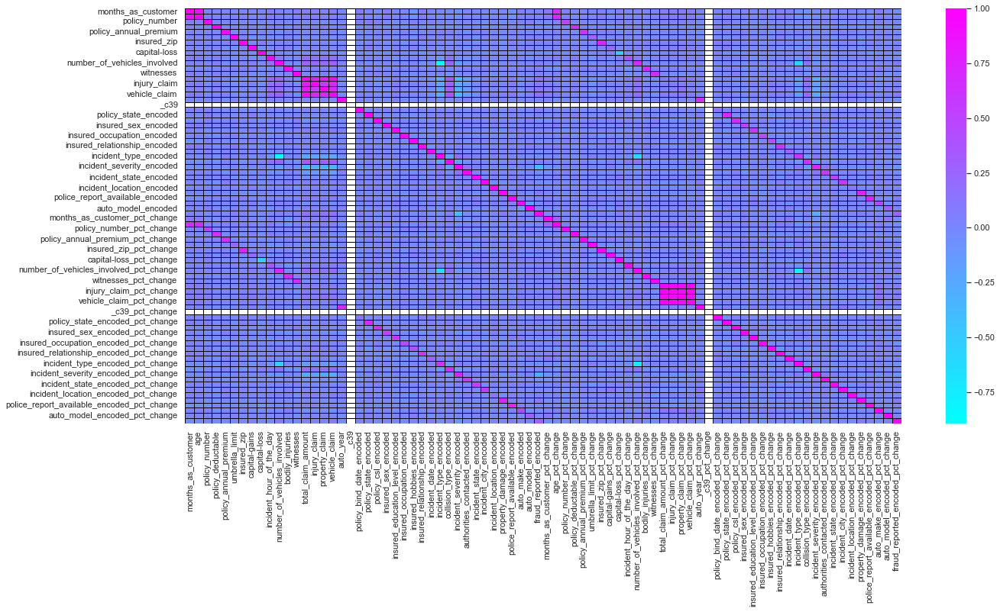

In [68]:
plt.figure(figsize=(21,10))
sns.heatmap(final_dataframe.corr(), annot=False, linewidths=0.5, linecolor='black', fmt='.2f', cmap='cool')

# Verbal Translation Of Above Graph:
## 1. Label has weak negative relationship with these features:

 ['policy_number', 'policy_annual_premium', 'capital-gains',
       'capital-loss', 'policy_csl_encoded', 'insured_hobbies_encoded',
       'incident_date_encoded', 'incident_type_encoded',
       'incident_severity_encoded', 'authorities_contacted_encoded',
       'incident_state_encoded', 'incident_city_encoded',
       'incident_location_encoded', 'police_report_available_encoded',
       'auto_make_encoded', 'policy_number_pct_change',
       'policy_annual_premium_pct_change', 'capital-gains_pct_change',
       'injury_claim_pct_change', 'policy_csl_encoded_pct_change',
       'insured_education_level_encoded_pct_change',
       'insured_occupation_encoded_pct_change',
       'insured_hobbies_encoded_pct_change',
       'insured_relationship_encoded_pct_change',
       'incident_date_encoded_pct_change', 'incident_type_encoded_pct_change',
       'incident_severity_encoded_pct_change',
       'authorities_contacted_encoded_pct_change',
       'incident_state_encoded_pct_change', 'auto_make_encoded_pct_change']


## 2. Label has weak positive to strong positive relationship with these features in this heatmap:

 ['months_as_customer', 'age', 'policy_deductable', 'umbrella_limit',
       'insured_zip', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year', 'policy_bind_date_encoded', 'policy_state_encoded',
       'insured_sex_encoded', 'insured_education_level_encoded',
       'insured_occupation_encoded', 'insured_relationship_encoded',
       'collision_type_encoded', 'property_damage_encoded',
       'auto_model_encoded', 'fraud_reported_encoded',
       'months_as_customer_pct_change', 'age_pct_change',
       'policy_deductable_pct_change', 'umbrella_limit_pct_change',
       'insured_zip_pct_change', 'capital-loss_pct_change',
       'incident_hour_of_the_day_pct_change',
       'number_of_vehicles_involved_pct_change', 'bodily_injuries_pct_change',
       'witnesses_pct_change', 'total_claim_amount_pct_change',
       'property_claim_pct_change', 'vehicle_claim_pct_change',
       'auto_year_pct_change', 'policy_bind_date_encoded_pct_change',
       'policy_state_encoded_pct_change', 'insured_sex_encoded_pct_change',
       'collision_type_encoded_pct_change', 'incident_city_encoded_pct_change',
       'incident_location_encoded_pct_change',
       'property_damage_encoded_pct_change',
       'police_report_available_encoded_pct_change',
       'auto_model_encoded_pct_change', 'fraud_reported_encoded_pct_change']


## 3. Strong Multicollinearity is detected among these features:
 
 [Injury Claim and vehiclile claim,injury claim and property claim; month as a customer and age; policy number and month as custmer; ploicy number and age; witness and vehiclile claim; witness and property claim; witness and injury claim; incident type conded; and their percentage translation]

## 4. Multicollinearity seems to be moderate among all other data points.

## Q&A Answered

        1. Most useful feature is: Incident Severity Encoded.

        2. Features that can cause bias are:  [Injury Claim and vehiclile claim,injury claim and property claim; month as a customer and age; policy number and month as custmer; ploicy number and age; witness and vehiclile claim; witness and property claim; witness and injury claim; incident type conded; and their percentage translation]

        3. Explanatory Power of all variable: Weak (due to weak correlation with label).

# Data Handling Conclusion Of Correlation

# Overall correlation among dataset. There seems some multicollinearity due to presence of  [Injury Claim and vehiclile claim,injury claim and property claim; month as a customer and age; policy number and month as custmer; ploicy number and age; witness and vehiclile claim; witness and property claim; witness and injury claim; incident type conded; and their percentage translation]; that show strong correlation among them. Other than these columns there seems modest collinearity among features. We will do further eda befor arriving at a conclusion to delete these columns.

## The most useful feature is Incident Severity Encoded, apart from this, there seems modest correlation of features with label.

## As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity pairs:

##     [Injury Claim and vehiclile claim,injury claim and property claim; month as a customer and age; policy number and month as custmer; ploicy number and age; witness and vehiclile claim; witness and property claim; witness and injury claim; incident type conded; and their percentage translation]

# Dataset Information Table

In [71]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 80 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   months_as_customer                          1000 non-null   int64  
 1   age                                         1000 non-null   int64  
 2   policy_number                               1000 non-null   int64  
 3   policy_deductable                           1000 non-null   int64  
 4   policy_annual_premium                       1000 non-null   float64
 5   umbrella_limit                              1000 non-null   int64  
 6   insured_zip                                 1000 non-null   int64  
 7   capital-gains                               1000 non-null   int64  
 8   capital-loss                                1000 non-null   int64  
 9   incident_hour_of_the_day                    1000 non-null   int64  
 10  number_of_veh

# The above table reprents information dataset:
    
i. Columns

ii. Count Of Non Null Data Points

iii. Values data type for each columns

iv. Count of data types in iii.

v. Memory Usage

It can be deduced that the dataset has 1000 rows and each column has no missing values. The datatype used are float64 and int64. There 63 float64 columns, 17 int64 columns. Memory usage is 625.1 KB.

# Names of all the columns

In [72]:
data.select_dtypes(include = [np.number]).columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year', '_c39', 'policy_bind_date_encoded', 'policy_state_encoded',
       'policy_csl_encoded', 'insured_sex_encoded',
       'insured_education_level_encoded', 'insured_occupation_encoded',
       'insured_hobbies_encoded', 'insured_relationship_encoded',
       'incident_date_encoded', 'incident_type_encoded',
       'collision_type_encoded', 'incident_severity_encoded',
       'authorities_contacted_encoded', 'incident_state_encoded',
       'incident_city_encoded', 'incident_location_encoded',
       'property_damage_encoded', 'police_report_available_encoded',
       'auto_make_encoded', 'auto_model_encoded', 'fraud_r

# The above code cell highlights all numeric columns, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [73]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
for x in colist:
    try:
        fig = px.box(final_dataframe, x = x, y='fraud_reported_encoded')
        fig.show()
    except ValueError:
        print('{0} vales out of range, try skewness function to detect outliers'.format(x))
        continue

# Verbal Translation Of Above Graph
## 1. Of 80 columns only 16 columns are free of outliers, namely:

# policy annual premium

# insured zip

# total claim amount

# policy bind date

# incident location encoded

# months as customer pct change

# policy number pct change

# policy annual premium pct change

# insured zip pct change

# capital gains pct change

# total claim amount pct change

# injury claim pct change

# property claim pct change

# vehicle claim pct change

# policy bind date encoded pct change

# incident location encoded pct change

# Data Handling Conclusion For Outliers

# Box plots indicate widely spread values with high number of outliers for most of the columns, hence, removing outliers with z values and power transform will be far more helpful than retaining only 16 columns.

# Descriptive Statistics

In [74]:
description=final_dataframe.describe()
description

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,...,-0.114833,0.043750,0.446700,0.223650,2.814118,-0.225000,-0.224000,0.599986,1.122556,-0.184000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,...,0.696055,0.964975,1.661460,1.307065,21.420998,0.417791,0.417131,2.146832,4.062498,0.387678
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,...,-0.500000,-0.666667,-0.750000,-0.600000,-0.502320,0.000000,0.000000,-0.545455,-0.480000,0.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,...,0.000000,0.000000,0.000000,0.000000,0.009971,0.000000,0.000000,0.000000,0.000000,0.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,...,0.000000,0.000000,0.270833,0.333333,1.035981,0.000000,0.000000,0.606250,0.883987,0.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,...,2.000000,3.000000,5.000000,5.000000,462.500000,0.000000,0.000000,12.000000,37.000000,0.000000


In [75]:
lst=description.columns.to_list()
print(lst)

['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', '_c39', 'policy_bind_date_encoded', 'policy_state_encoded', 'policy_csl_encoded', 'insured_sex_encoded', 'insured_education_level_encoded', 'insured_occupation_encoded', 'insured_hobbies_encoded', 'insured_relationship_encoded', 'incident_date_encoded', 'incident_type_encoded', 'collision_type_encoded', 'incident_severity_encoded', 'authorities_contacted_encoded', 'incident_state_encoded', 'incident_city_encoded', 'incident_location_encoded', 'property_damage_encoded', 'police_report_available_encoded', 'auto_make_encoded', 'auto_model_encoded', 'fraud_reported_encoded', 'months_as_customer_pct_change', 'age_pct_change', 'policy_number_pct_change', 'policy

In [76]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[76.75], [6.0], [225964.75], [1000.0], [158.49500000000035], [0.0], [136805.5], [51025.0], [23250.0], [5.0], [2.0], [1.0], [1.0], [12537.5], [4530.0], [4135.0], [8722.5], [5.0], [0.0], [240.75], [1.0], [1.0], [1.0], [2.0], [3.0], [5.0], [2.0], [14.5], [1.0], [1.0], [1.0], [2.0], [1.0], [2.0], [249.75], [0.0], [0.0], [3.0], [9.0], [0.0], [0.8594767009026747], [0.2647058823529411], [0.6732602808674554], [1.0], [0.19415597473120172], [0.0], [0.06585787029423379], [0.0], [0.0], [0.6666666666666667], [0.33333333333333326], [0.0], [0.0], [0.4450890569340607], [0.9087101753248288], [0.8854290440491298], [0.4446464117960291], [0.0029955067398901303], [0.0], [0.9790892745455583], [0.0], [0.0], [0.0], [0.5], [0.5785714285714285], [0.625], [0.33333333333333326], [0.9244505494505495], [0.0], [0.0], [0.0], [0.0], [0.2708333333333333], [0.33333333333333326], [1.0260094153228683], [0.0], [0.0], [0.6062500000000001], [0.8839869281045751], [0.0]]


(80, None)

In [77]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
IQR,76.75,6.0,225964.75,1000.0,158.495,0.0,136805.5,51025.0,23250.0,5.0,...,0.0,0.0,0.270833,0.333333,1.026009,0.0,0.0,0.60625,0.883987,0.0


In [78]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])
len(lst3), print(lst3)

[[479.0], [45.0], [898631.0], [1500.0], [1614.26], [11000000.0], [190858.0], [100500.0], [111100.0], [23.0], [3.0], [2.0], [3.0], [114820.0], [21450.0], [23670.0], [79490.0], [20.0], [0.0], [950.0], [2.0], [2.0], [1.0], [6.0], [13.0], [19.0], [5.0], [59.0], [3.0], [2.0], [3.0], [4.0], [6.0], [6.0], [999.0], [1.0], [1.0], [13.0], [38.0], [1.0], [134.5], [2.281206171107994], [9.228703995271893], [3.75], [2.9002204435730445], [2.5], [0.746465117289618], [45.5], [8.701754385964913], [23.0], [3.75], [2.0], [3.0], [563.3968434343434], [626.0], [313.0], [625.9971590909091], [0.019950620969296673], [0.0], [942.0], [2.0], [2.0], [1.0], [6.0], [13.0], [19.0], [5.0], [58.0], [3.0], [2.0], [3.0], [4.0], [6.0], [6.0], [463.5], [1.0], [1.0], [13.0], [38.0], [1.0]]


(80, None)

In [79]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
Range,479.0,45.0,898631.0,1500.0,1614.26,11000000.0,190858.0,100500.0,111100.0,23.0,...,3.0,4.0,6.0,6.0,463.5,1.0,1.0,13.0,38.0,1.0


In [80]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(          months_as_customer       age  policy_number  policy_deductable  \
 Skewness            0.362177  0.478988       0.038991           0.477887   
 
           policy_annual_premium  umbrella_limit  insured_zip  capital-gains  \
 Skewness               0.004402        1.806712     0.816554        0.47885   
 
           capital-loss  incident_hour_of_the_day  ...  \
 Skewness     -0.391472                 -0.035584  ...   
 
           incident_severity_encoded_pct_change  \
 Skewness                                0.9284   
 
           authorities_contacted_encoded_pct_change  \
 Skewness                                  1.690182   
 
           incident_state_encoded_pct_change  incident_city_encoded_pct_change  \
 Skewness                           1.724327                          2.105133   
 
           incident_location_encoded_pct_change  \
 Skewness                             15.954809   
 
           property_damage_encoded_pct_change  \
 Skewness                    

# Outcome Table Of Descriptive Statistics

In [81]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,...,-0.114833,0.043750,0.446700,0.223650,2.814118,-0.225000,-0.224000,0.599986,1.122556,-0.184000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,...,0.696055,0.964975,1.661460,1.307065,21.420998,0.417791,0.417131,2.146832,4.062498,0.387678
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,...,-0.500000,-0.666667,-0.750000,-0.600000,-0.502320,0.000000,0.000000,-0.545455,-0.480000,0.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,...,0.000000,0.000000,0.000000,0.000000,0.009971,0.000000,0.000000,0.000000,0.000000,0.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,...,0.000000,0.000000,0.270833,0.333333,1.035981,0.000000,0.000000,0.606250,0.883987,0.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,...,2.000000,3.000000,5.000000,5.000000,462.500000,0.000000,0.000000,12.000000,37.000000,0.000000
IQR,76.750000,6.000000,225964.750000,1000.000000,158.495000,0.000000e+00,136805.500000,51025.000000,23250.000000,5.000000,...,0.000000,0.000000,0.270833,0.333333,1.026009,0.000000,0.000000,0.606250,0.883987,0.000000
Range,479.000000,45.000000,898631.000000,1500.000000,1614.260000,1.100000e+07,190858.000000,100500.000000,111100.000000,23.000000,...,3.000000,4.000000,6.000000,6.000000,463.500000,1.000000,1.000000,13.000000,38.000000,1.000000


# Graphical Representation Of Above Table

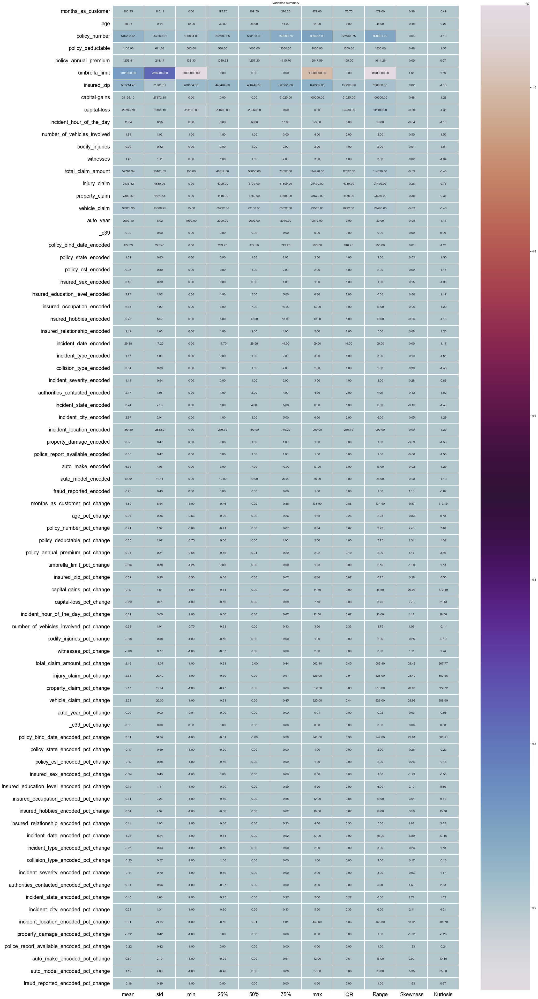

In [82]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, color='Black', cmap='twilight')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic
## 1. For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

## 2. The entire dataset ranges from -1000000.0 till 10000000.0.

## 3. IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

## 4. Skewness is 0 and within +/- 0.65 for:

    ['months_as_customer', 'age', 'policy_number', 'policy_deductable',
           'policy_annual_premium', 'capital-gains', 'capital-loss',
           'incident_hour_of_the_day', 'number_of_vehicles_involved',
           'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim',
           'property_claim', 'vehicle_claim', 'auto_year', '_c39',
           'policy_bind_date_encoded', 'policy_state_encoded',
           'policy_csl_encoded', 'insured_sex_encoded',
           'insured_education_level_encoded', 'insured_occupation_encoded',
           'insured_hobbies_encoded', 'insured_relationship_encoded',
           'incident_date_encoded', 'incident_type_encoded',
           'collision_type_encoded', 'incident_severity_encoded',
           'authorities_contacted_encoded', 'incident_state_encoded',
           'incident_city_encoded', 'incident_location_encoded',
           'auto_make_encoded', 'auto_model_encoded', 'insured_zip_pct_change',
           'bodily_injuries_pct_change', 'auto_year_pct_change', '_c39_pct_change',
           'policy_state_encoded_pct_change', 'policy_csl_encoded_pct_change',
           'incident_type_encoded_pct_change',
           'collision_type_encoded_pct_change']
  

## 5. Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

## 6. Kutosis is upto 3 for most dataset, indicating platykurtic curves:

    ['months_as_customer', 'age', 'policy_number', 'policy_deductable',
           'policy_annual_premium', 'umbrella_limit', 'insured_zip',
           'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
           'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
           'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
           'auto_year', '_c39', 'policy_bind_date_encoded', 'policy_state_encoded',
           'policy_csl_encoded', 'insured_sex_encoded',
           'insured_education_level_encoded', 'insured_occupation_encoded',
           'insured_hobbies_encoded', 'insured_relationship_encoded',
           'incident_date_encoded', 'incident_type_encoded',
           'collision_type_encoded', 'incident_severity_encoded',
           'authorities_contacted_encoded', 'incident_state_encoded',
           'incident_city_encoded', 'incident_location_encoded',
           'property_damage_encoded', 'police_report_available_encoded',
           'auto_make_encoded', 'auto_model_encoded', 'fraud_reported_encoded',
           'age_pct_change', 'policy_deductable_pct_change',
           'umbrella_limit_pct_change', 'insured_zip_pct_change',
           'number_of_vehicles_involved_pct_change', 'bodily_injuries_pct_change',
           'witnesses_pct_change', 'auto_year_pct_change', '_c39_pct_change',
           'policy_state_encoded_pct_change', 'policy_csl_encoded_pct_change',
           'insured_sex_encoded_pct_change', 'incident_type_encoded_pct_change',
           'collision_type_encoded_pct_change',
           'incident_severity_encoded_pct_change',
           'authorities_contacted_encoded_pct_change',
           'incident_state_encoded_pct_change',
           'property_damage_encoded_pct_change',
           'police_report_available_encoded_pct_change',
           'fraud_reported_encoded_pct_change']

## 7. Kurtosis is greater than 3, indicating, leptokurtic curve:

    ['months_as_customer_pct_change', 'policy_number_pct_change',
           'policy_annual_premium_pct_change', 'capital-gains_pct_change',
           'capital-loss_pct_change', 'incident_hour_of_the_day_pct_change',
           'total_claim_amount_pct_change', 'injury_claim_pct_change',
           'property_claim_pct_change', 'vehicle_claim_pct_change',
           'policy_bind_date_encoded_pct_change',
           'insured_education_level_encoded_pct_change',
           'insured_occupation_encoded_pct_change',
           'insured_hobbies_encoded_pct_change',
           'insured_relationship_encoded_pct_change',
           'incident_date_encoded_pct_change', 'incident_city_encoded_pct_change',
           'incident_location_encoded_pct_change', 'auto_make_encoded_pct_change',
           'auto_model_encoded_pct_change']

## 8. Kurtosis for bell shaped curve should be 3.

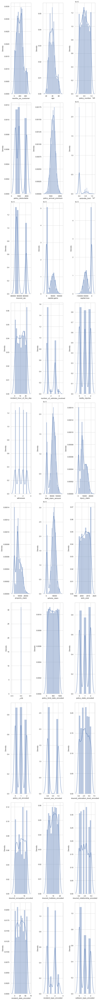

In [90]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

# Observations
## 1. Acceptable skewness is +/-0.65 and Right skewness for bell shaped curve is 0

## 2. Acceptable and Outliers Prone Left skewness is observed in:

        capital-loss                                 -0.391472
        
        incident_hour_of_the_day                     -0.035584
        
        total_claim_amount                           -0.594582
        
        vehicle_claim                                -0.621098
        
        auto_year                                    -0.048289
        
        policy_state_encoded                         -0.026177
        
        insured_education_level_encoded              -0.000148
        
        insured_occupation_encoded                   -0.058881
        
        insured_hobbies_encoded                      -0.061563
        
        authorities_contacted_encoded                -0.121744
        
        incident_state_encoded                       -0.148865
        
        property_damage_encoded                      -0.685977
        
        police_report_available_encoded              -0.662448
        
        auto_make_encoded                            -0.018797
        
        auto_model_encoded                           -0.080773
        
        umbrella_limit_pct_change                    -1.599811
        
        insured_sex_encoded_pct_change               -1.225833
        
        property_damage_encoded_pct_change           -1.319085
        
        police_report_available_encoded_pct_change   -1.325978
        
        fraud_reported_encoded_pct_change            -1.633486


## 3. Acceptable And Outliers Prone Right Skewness is observed in:

        months_as_customer                             0.362177
        
        age                                            0.478988
        
        policy_number                                  0.038991
        
        policy_deductable                              0.477887
        
        policy_annual_premium                          0.004402
        
        umbrella_limit                                 1.806712
        
        insured_zip                                    0.816554
        
        capital-gains                                  0.478850
        
        number_of_vehicles_involved                    0.502664
        
        bodily_injuries                                0.014777
        
        witnesses                                      0.019636
        
        injury_claim                                   0.264811
        
        property_claim                                 0.378169
        
        policy_bind_date_encoded                       0.005194
        
        policy_csl_encoded                             0.088928
        
        insured_sex_encoded                            0.148630
        
        insured_relationship_encoded                   0.077488
        
        incident_date_encoded                          0.004756
        
        incident_type_encoded                          0.101507
        
        collision_type_encoded                         0.297203
        
        incident_severity_encoded                      0.279016
        
        incident_city_encoded                          0.049531
        
        fraud_reported_encoded                         1.175051
        
        months_as_customer_pct_change                  9.872077
        
        age_pct_change                                 0.825190
        
        policy_number_pct_change                       2.428475
        
        policy_deductable_pct_change                   1.336814
        
        policy_annual_premium_pct_change               1.173991
        
        insured_zip_pct_change                         0.393884
        
        capital-gains_pct_change                      26.063379
        
        capital-loss_pct_change                        2.763810
        
        incident_hour_of_the_day_pct_change            4.117989
        
        number_of_vehicles_involved_pct_change         1.092312
        
        bodily_injuries_pct_change                     0.248290
        
        witnesses_pct_change                           1.106056
        
        total_claim_amount_pct_change                 28.494048
        
        injury_claim_pct_change                       28.493064
        
        property_claim_pct_change                     20.046872
        
        vehicle_claim_pct_change                      28.993273
        
        auto_year_pct_change                           0.026788
        
        policy_bind_date_encoded_pct_change           22.609422
        
        policy_state_encoded_pct_change                0.261473
        
        policy_csl_encoded_pct_change                  0.262932
        
        insured_education_level_encoded_pct_change     2.103365
        
        insured_occupation_encoded_pct_change          3.035477
        
        insured_hobbies_encoded_pct_change             3.588781
        
        insured_relationship_encoded_pct_change        1.823069
        
        incident_date_encoded_pct_change               6.891796
        
        incident_type_encoded_pct_change               0.257246
        
        collision_type_encoded_pct_change              0.167721
        
        incident_severity_encoded_pct_change           0.928400
        
        authorities_contacted_encoded_pct_change       1.690182
        
        incident_state_encoded_pct_change              1.724327
        
        incident_city_encoded_pct_change               2.105133
        
        incident_location_encoded_pct_change          15.954809
        
        auto_make_encoded_pct_change                   2.987961
        
        auto_model_encoded_pct_change                  5.347816

## 4. Bell Shaped Curve (O skewness) is observed in:

        _c39                         0.0
        
        incident_location_encoded    0.0
        
        _c39_pct_change              0.0

# Re Verification Of Multicollinearity Pairs

In [60]:
correlation=final_dataframe.corr()
correlation[correlation>0.5].head(30)

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
months_as_customer,1.000000,0.922098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,0.922098,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
policy_number,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
policy_deductable,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
policy_annual_premium,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
umbrella_limit,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
insured_zip,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
capital-gains,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
capital-loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
incident_hour_of_the_day,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Conclusion:
## Based On EDA done above in two parts, I will do ftest and pvalue test on these seeming strong and weak indicators:

    incident_location_encoded_pct_change  (Skewness and Kurtosis)

    property_claim_pct_change             (Skewness and Kurtosis)

    policy_bind_date_encoded_pct_change   (Skewness and Kurtosis)

    capital-gains_pct_change              (Skewness and Kurtosis)

    injury_claim_pct_change               (Skewness and Kurtosis)

    total_claim_amount_pct_change         (Skewness and Kurtosis)

    vehicle_claim_pct_change              (Skewness and Kurtosis)

    incident_date_encoded_pct_change      (Skewness and Kurtosis)

    months_as_customer_pct_change         (Skewness and Kurtosis)

    age                                   (Multicollinearity)

    months_as_customer                    (Multicollinearity)

# ANOVA Test On Selected Features
## Ftest score should be greater than 1 and p value should be less than 0.05, to determine to keep these features for further analysis

# Feature 1: Incident Location Encoded Pct Change

In [94]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['incident_location_encoded_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(14.356082168234572, 0.00015576762888838038)

# Feature 2: Property Claim Pct Change

In [95]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['property_claim_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(27.7328686217275, 1.542551140444102e-07)

# Feature 3: Policy Bind Date Encoded Pct Change

In [96]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['policy_bind_date_encoded_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(7.96015029502405, 0.00482911283204585)

# Feature 4: Capital Gains Pct Change

In [97]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['capital-gains_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(72.09703410993312, 3.935302629166063e-17)

# Feature 5: Injury Claim Pct Change

In [98]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['injury_claim_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(10.915603214725405, 0.0009704194352973075)

# Feature 6: Total Claim Amount Pct Change

In [99]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['total_claim_amount_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(10.801303677012902, 0.0010318537507408476)

# Feature 7: Vehicle Claim Pct Change

In [100]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['vehicle_claim_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(9.445092610283833, 0.0021457521724605145)

# Feature 8: Incident Date Encoded Pct Change

In [101]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['incident_date_encoded_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(36.766215201369256, 1.5882372725480876e-09)

# Feature 9: Month As Customer Pct Change

In [102]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['months_as_customer_pct_change'], final_dataframe['fraud_reported_encoded'])
f,p

(24.94715497270509, 6.404457583614399e-07)

# Feature 10: Age

In [103]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['age'], final_dataframe['fraud_reported_encoded'])
f,p

(17887.844152064343, 0.0)

# Feature 11: Months As Customer

In [104]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['months_as_customer'], final_dataframe['fraud_reported_encoded'])
f,p

(3131.5239909441993, 0.0)

# Error Removal And Data Handling

## Based on above analysis:
## 1. There are no outliers in the data.
## 2. Strong multicolliearity features are important for prediction because there f test and p value are acceptable. This mean that the amount of multicollineaity is insignificant and removing the feature will lower bias in the model.
# 3. Extereme leptokurtic and right skewed features are also relatively significant based on f test and p test.

# Hence, as a solution, feature scaling will do a better job in explaining the dependent variable than removing whole columns.

## Multicollinearity removal can be explained better with outliers transformation and vif scores.

# Z Score: Outliers Treatment

In [105]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
final_dataframe[np.isinf(final_dataframe)] = 0
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(method='ffill')
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(1000, 80)

In [106]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([  4,   6,   8,  12,  24,  25,  26,  27,  30,  31,  34,  42,  42,
        43,  44,  48,  48,  48,  48,  48,  51,  53,  56,  63,  72,  74,
        77,  78,  78,  81,  83,  85,  86,  87,  87,  88,  91,  92,  92,
        94,  96,  98,  99, 100, 103, 104, 105, 106, 109, 109, 110, 111,
       114, 115, 119, 119, 121, 125, 129, 129, 133, 135, 138, 139, 139,
       147, 150, 150, 152, 156, 158, 160, 167, 167, 168, 169, 172, 174,
       177, 179, 180, 181, 181, 193, 196, 196, 199, 200, 200, 202, 202,
       207, 207, 207, 210, 210, 211, 215, 217, 217, 219, 224, 226, 229,
       235, 238, 238, 239, 241, 245, 245, 245, 247, 247, 248, 249, 250,
       251, 255, 258, 262, 263, 264, 265, 266, 267, 270, 272, 275, 281,
       281, 285, 287, 290, 293, 294, 296, 296, 297, 297, 299, 301, 304,
       307, 310, 314, 317, 319, 319, 327, 329, 329, 333, 335, 337, 337,
       337, 339, 340, 341, 341, 342, 343, 343, 350, 353, 353, 355, 357,
       359, 360, 360, 366, 366, 369, 369, 369, 374, 375, 380, 3

# The cell above displays outlier values.

In [107]:
len(np.where(score>3)[0])

440

# The cell above shows number of outliers.

In [108]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change


# The table above shows the final dataframe after removing outliers, 8 rows are removed and resultant dimension is 0 rows * 33 columns

# IQR Method Of Outliers Removal

# Since, most the rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [109]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

# The above code calculates IQR as discussed in descriptive statistics section of eda. It Upper Limit and Lower Limit of distribution curve.

In [110]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,5000000.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,11.000000,NaN
2,NaN,NaN,NaN,NaN,NaN,5000000.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-1.0,-1.0,NaN,NaN,-1.0
3,NaN,NaN,NaN,NaN,NaN,6000000.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,6000000.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.666667,NaN
997,NaN,NaN,NaN,NaN,NaN,3000000.0,NaN,NaN,NaN,NaN,...,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
998,NaN,NaN,NaN,NaN,NaN,5000000.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places NaN on all the values that are significant and within upper and lower limits.

In [111]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [112]:
new_df=new_df.fillna(method='bfill')
new_df

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change,fraud_reported_encoded_pct_change
0,328,48.0,521585,1000,1406.91,NaN,466132,53300,0,5,...,0.0,0.000000,0.00,0.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN
1,228,42.0,342868,2000,1197.22,NaN,468176,0,0,8,...,0.0,0.000000,0.25,-0.800000,-0.369478,NaN,NaN,-0.200000,1.500000,NaN
2,134,29.0,687698,2000,1413.14,NaN,430632,35100,0,7,...,0.0,0.000000,-0.80,-0.800000,0.090764,NaN,NaN,-0.500000,1.500000,NaN
3,256,41.0,227811,2000,1415.74,NaN,608117,48900,-62400,5,...,-1.0,0.000000,1.00,-1.000000,-0.023358,NaN,NaN,-0.250000,0.133333,NaN
4,228,44.0,367455,1000,1583.91,NaN,610706,66000,-46000,20,...,0.0,-0.500000,-0.50,0.000000,-0.671151,NaN,NaN,-1.000000,-0.088235,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38.0,941851,1000,1310.80,NaN,431289,0,0,20,...,0.0,-0.500000,-1.00,0.333333,-0.087805,NaN,NaN,0.000000,-0.400000,NaN
996,285,41.0,186934,1000,1436.79,NaN,608177,70900,0,23,...,-1.0,0.000000,0.00,-0.250000,-0.595365,NaN,NaN,1.166667,-0.321429,NaN
997,130,34.0,918516,500,1383.49,NaN,442797,35100,0,4,...,0.0,-0.250000,-1.00,-1.000000,2.286344,NaN,NaN,-0.153846,-0.321429,NaN
998,458,60.0,533940,2000,1356.92,NaN,441714,0,0,2,...,-1.0,-0.250000,0.00,0.000000,-0.237265,NaN,NaN,-0.909091,-0.736842,NaN


# The above table displays the final dataframe after IQR  treatment, since this method restores most the rows. It signifies that outliers are not very much spread and can be treated with power transform method after removing significant outliers rows.

# I prefer IQR+ Power Transform in this case because Z Score method has removed all the values but IQR has retained alll the values. This signifies that outliers are not very significant and meaningful prediction can be maded with scaling, transforming and normalizing all the values. As even suggested by ANOVA test on most deviant and biased values.

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

Label vector is FraudReportedEncoded.

In [113]:
final_dataframe=final_dataframe.copy()
x=final_dataframe.drop(['fraud_reported_encoded', 'fraud_reported_encoded_pct_change'], axis=1)
y=final_dataframe['fraud_reported_encoded']
x.sample()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,collision_type_encoded_pct_change,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change
787,133,30,920554,1000,1231.01,0,459562,0,-31700,19,...,-1.0,0.0,0.0,3.0,0.666667,-0.141509,-1.0,0.0,-0.666667,2.0


# The above table displays a sample of features vector.

In [114]:
y.sample()

340    1.0
Name: fraud_reported_encoded, dtype: float64

# The above series displays a sample of label series.

# Outliers Transformation With Power Transform

In [115]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,...,collision_type_encoded_pct_change,incident_severity_encoded_pct_change,authorities_contacted_encoded_pct_change,incident_state_encoded_pct_change,incident_city_encoded_pct_change,incident_location_encoded_pct_change,property_damage_encoded_pct_change,police_report_available_encoded_pct_change,auto_make_encoded_pct_change,auto_model_encoded_pct_change
0,1.051279,1.008733,-0.023156,0.067784,0.616676,-0.349113,0.0,1.033234,1.049532,-0.911676,...,0.372546,0.328340,0.253252,0.135880,0.191392,0.005935,0.538816,0.537271,0.098935,0.015674
1,0.304536,0.431433,-0.745292,1.271863,-0.242577,1.357817,0.0,-0.982948,1.049532,-0.441383,...,-1.431656,0.328340,0.253252,0.376857,1.959929,-0.496535,0.538816,0.537271,-0.156714,1.961213
2,-0.511226,-1.139513,0.587931,1.271863,0.642206,1.357817,0.0,0.960141,1.049532,-0.593040,...,0.372546,0.328340,0.253252,-1.177531,-1.172253,0.098284,-1.855921,-1.861259,-0.651469,0.909347
3,0.523344,0.327852,-1.266438,1.271863,0.652860,1.644005,0.0,1.018186,-1.005137,-0.911676,...,-1.431656,-1.508167,0.253252,0.854214,-1.647119,-0.019674,0.538816,0.537271,-0.229747,0.153045
4,0.304536,0.631918,-0.640684,0.067784,1.342030,1.644005,0.0,1.070503,-0.940361,1.151959,...,0.372546,0.328340,-0.534520,-0.581388,0.191392,-1.070648,-1.855921,0.537271,-1.790464,-0.088779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.287530,0.002457,1.449469,0.067784,0.222833,-0.349113,0.0,-0.982948,1.049532,1.151959,...,0.372546,0.328340,-0.534520,-1.646704,0.526486,-0.094515,0.538816,0.537271,0.098935,-0.553250
996,0.741446,0.327852,-1.468221,0.067784,0.739122,-0.349113,0.0,1.082972,1.049532,1.508938,...,0.372546,-1.508167,0.253252,0.135880,-0.144026,-0.911865,0.538816,0.537271,0.898920,1.389197
997,-0.549706,-0.470444,1.373308,-1.211269,0.520703,0.756509,0.0,0.960141,1.049532,-1.080756,...,2.045346,0.328340,2.096187,-1.646704,-1.647119,1.055071,0.538816,0.537271,-0.092572,-0.421788
998,1.912654,2.130554,0.023977,1.271863,0.411823,1.357817,0.0,-0.982948,1.049532,-1.447906,...,-0.514569,-1.508167,-0.103487,0.135880,0.191392,-0.292323,0.538816,0.537271,-1.553106,-1.232273


# The above table displays outliers transformed values as discussed above.

In [116]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [117]:
y.unique()

array([1., 0.])

In [118]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,1])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[0.7769837 , 0.75464753, 0.53623559, ..., 1.        , 0.46590013,
        0.43838782],
       [0.60911735, 0.64244311, 0.33429149, ..., 1.        , 0.40286055,
        0.88389414],
       [0.42573566, 0.33711257, 0.70712505, ..., 0.        , 0.28086067,
        0.64302885],
       ...,
       [0.41708534, 0.46715347, 0.92675446, ..., 1.        , 0.41867708,
        0.33821409],
       [0.97061913, 0.97268579, 0.54941615, ..., 1.        , 0.05852927,
        0.15262214],
       [0.967797  , 0.94453685, 0.57282774, ..., 1.        , 0.92269764,
        0.63508305]])

# In the above cell, I have done positive scaling of features to make positive prediction. I have taken range of 10 to 1000 because that can be fitted as a good match with intercept to make big numeric prediction. Also, these values are more alike the label vector, hence, model performance can be sound.

In [119]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [120]:
x_frame1.values.max()

1.0000000000000002

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

In [121]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
52,1771.383195,total_claim_amount_pct_change
13,1284.110922,total_claim_amount
55,1183.423659,vehicle_claim_pct_change
16,691.351681,vehicle_claim
5,148.189268,umbrella_limit
...,...,...
7,2.917262,capital-gains
22,2.774779,insured_sex_encoded
6,NaN,insured_zip
18,NaN,_c39


In [122]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
52,1771.383195,total_claim_amount_pct_change
13,1284.110922,total_claim_amount
55,1183.423659,vehicle_claim_pct_change
16,691.351681,vehicle_claim
5,148.189268,umbrella_limit
...,...,...
36,6.982816,police_report_available_encoded
50,6.956856,bodily_injuries_pct_change
60,6.889006,policy_csl_encoded_pct_change
61,6.272935,insured_sex_encoded_pct_change


In [123]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['total_claim_amount_pct_change','total_claim_amount_pct_change', 'vehicle_claim_pct_change', 'vehicle_claim', 'umbrella_limit', 'age', 'months_as_customer', 'total_claim_amount', 'property_claim', 'injury_claim', 'policy_annual_premium', 'age_pct_change', 'incident_type_encoded', 'auto_year_pct_change', 'policy_annual_premium_pct_change', 'incident_location_encoded', 'incident_hour_of_the_day',  'policy_bind_date_encoded', 'policy_number_pct_change', 'incident_date_encoded', 'property_claim_pct_change', 'insured_occupation_encoded_pct_change', 'insured_hobbies_encoded', 'number_of_vehicles_involved_pct_change', 'auto_make_encoded', 'auto_model_encoded', 'collision_type_encoded_pct_change', 'insured_relationship_encoded_pct_change', 'insured_education_level_encoded_pct_change', 'incident_city_encoded_pct_change','incident_state_encoded_pct_change', 'authorities_contacted_encoded_pct_change', 'witnesses_pct_change', 'incident_severity_encoded_pct_change', 'policy_deductable_pct_change', 'policy_state_encoded_pct_change', 'bodily_injuries_pct_change', 'police_report_available_encoded_pct_change', 'policy_csl_encoded_pct_change', 'property_damage_encoded_pct_change', 'umbrella_limit_pct_change'], axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
31,5.731726,insured_sex_encoded_pct_change
23,5.227766,months_as_customer_pct_change
25,4.927763,capital-gains_pct_change
28,4.822615,injury_claim_pct_change
0,4.795853,policy_number
30,4.689809,policy_bind_date_encoded_pct_change
34,4.685453,incident_type_encoded_pct_change
26,4.656630,capital-loss_pct_change
37,4.635349,auto_model_encoded_pct_change
35,4.593057,incident_location_encoded_pct_change


# Since, all the vif scores are below 6, I can pass the listed features for feature selection.

# Data Handling Conclusion

# Concluding Points:
1. As part of data handling, I have transformed features with high outliers (by analyzing box plots, dist plots, variable plot and scatter plots).                            

2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.                                                                  
3. Hence, the model can be expected to be low bias model.

# Feature Selection

In [124]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [125]:
x.shape, y.shape

((1000, 78), (1000,))

In [127]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30)

# In the above cell, I have checked final shape of each vector and splitted the dat ainto 30% test and 70% train.

In [128]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

# In the above code, I have put the values in Variance Threshold Filter and transformed those. To ensure low variance, I have taken variance threshold of 0.01.

<AxesSubplot:>

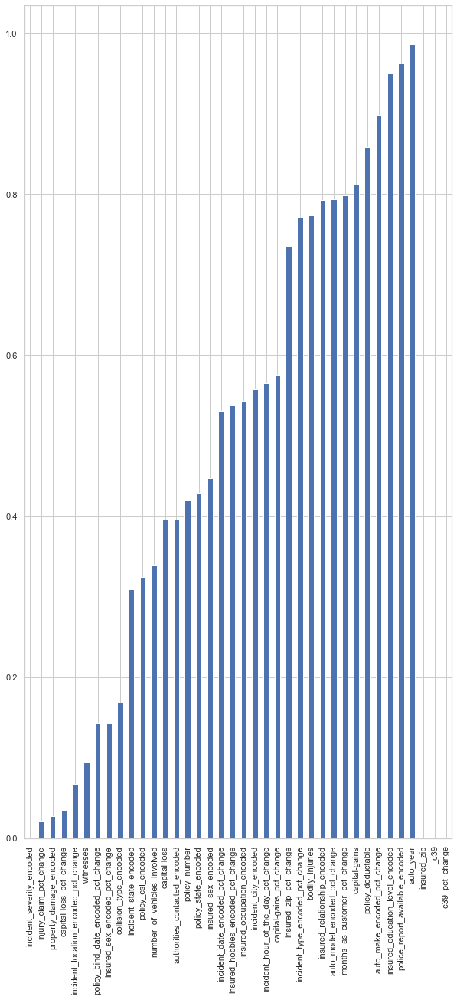

In [129]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [130]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['incident_severity_encoded', 'injury_claim_pct_change',
       'property_damage_encoded', 'capital-loss_pct_change'],
      dtype='object')

# These features strongly impact attrition and control actions are required mainly on these to curb the problems around attrition.

# P Values are an important component of feature selection, with significance level set to 0.05, Variance Threshold
    ensemble technique returns with 95% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.05 are:
Index('incident_severity_encoded', 'injury_claim_pct_change',
       'property_damage_encoded', 'capital-loss_pct_change', dtype='object')

In [131]:
import numpy as np
x=x_frame1.copy()
x=x[['incident_severity_encoded', 'injury_claim_pct_change',
       'property_damage_encoded', 'capital-loss_pct_change']]
x.sample()

,incident_severity_encoded,injury_claim_pct_change,property_damage_encoded,capital-loss_pct_change
59,0.426349,0.500349,0.0,0.274162


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [132]:
y.sample()

456    0.0
Name: fraud_reported_encoded, dtype: float64

In [133]:
x=x.reset_index(drop=True)
y=y.reset_index(drop=True)

# The above series displays a sample of label.

In [134]:
x.shape, y.shape

((1000, 4), (1000,))

# The above cell displays final shapes of x and y vectors

In [135]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.3)

In [136]:
x_train.shape, y_train.shape

((700, 4), (700,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Total Models = 10)

# Selection Reasoning Of Models 1 to 5

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven label points hence there is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that can lower variance and bias and help achieve a goodness of fit. (Just as a reminder, I have already applied variance threshold of 0.01 to ensure that risk of models is low). 

# The theories in the two cells above explain why I have chosen Model 1, Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is support vector classifier and hence, is again a very powerful implementation to prevent illness of fit and make appropriate decision boundaries.

# Model 1

# Random Forest Classifier With Intuitional Hyper Parameter Tuning

In [137]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [138]:
model1_prediction_train

,y_train,yhat
526,0.0,0.0
165,0.0,0.0
380,0.0,0.0
850,0.0,0.0
127,0.0,0.0
...,...,...
968,0.0,0.0
630,0.0,0.0
238,0.0,0.0
362,0.0,0.0


In [139]:
model1_prediction_test

,y_test,yhat
366,0.0,0.0
881,1.0,0.0
275,0.0,0.0
334,0.0,0.0
448,0.0,0.0
...,...,...
9,0.0,0.0
186,0.0,0.0
817,1.0,0.0
36,1.0,0.0


In [140]:
# Model 1 Metrics

In [141]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))
#Since risk is low model is low variance and since train score and test score are equivalent, model is low bias too.

Train Score:  0.77
Test Score:  0.72
Train Accuracy Score:  0.77
Test Accuracy Score:  0.72
Cross Validation Score:  0.75
Cross Validation Risk:  0.0


In [142]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred))

              precision    recall  f1-score   support

         0.0       0.72      1.00      0.84       217
         1.0       0.00      0.00      0.00        83

    accuracy                           0.72       300
   macro avg       0.36      0.50      0.42       300
weighted avg       0.52      0.72      0.61       300



In [143]:
print(confusion_matrix(y_test,ytst_pred))

[[217   0]
 [ 83   0]]


In [144]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print(auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

0.5


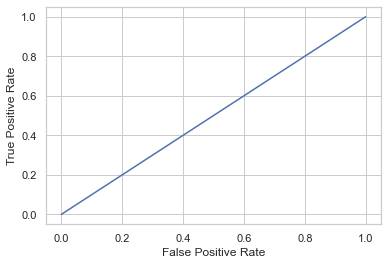

In [145]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


# Model 2

# Random Forest Classifier With Default Hyper Parameter Tuning

In [146]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [147]:
model2_prediction_train

,y_train,yhat
526,0.0,0.0
165,0.0,0.0
380,0.0,0.0
850,0.0,0.0
127,0.0,0.0
...,...,...
968,0.0,0.0
630,0.0,0.0
238,0.0,0.0
362,0.0,0.0


In [148]:
model2_prediction_test

,y_test,yhat
366,0.0,0.0
881,1.0,1.0
275,0.0,1.0
334,0.0,0.0
448,0.0,0.0
...,...,...
9,0.0,0.0
186,0.0,0.0
817,1.0,1.0
36,1.0,0.0


In [149]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  1.0
Test Score:  0.71
Train Accuracy Score:  1.0
Test Accuracy Score:  0.71
Cross Validation Score:  0.78
Cross Validation Risk:  0.03


In [150]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred1))

              precision    recall  f1-score   support

         0.0       0.79      0.82      0.81       217
         1.0       0.48      0.43      0.46        83

    accuracy                           0.71       300
   macro avg       0.64      0.63      0.63       300
weighted avg       0.71      0.71      0.71       300



In [151]:
print(confusion_matrix(y_test, ytst_pred1))

[[178  39]
 [ 47  36]]


In [152]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.63


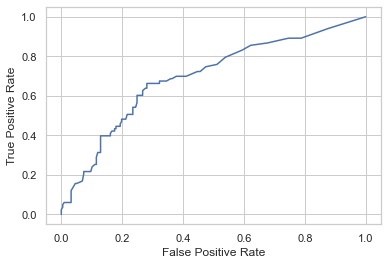

In [153]:
from sklearn import metrics
y_pred_proba =rfc1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 3

# RFC With Grid Search CV

In [155]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [156]:
# Model 3 Predictions

In [157]:
model3_prediction_train

,y_train,yhat
526,0.0,0.0
165,0.0,0.0
380,0.0,0.0
850,0.0,0.0
127,0.0,0.0
...,...,...
968,0.0,0.0
630,0.0,0.0
238,0.0,0.0
362,0.0,0.0


In [158]:
model3_prediction_test

,y_test,yhat
366,0.0,0.0
881,1.0,1.0
275,0.0,0.0
334,0.0,1.0
448,0.0,0.0
...,...,...
9,0.0,0.0
186,0.0,0.0
817,1.0,1.0
36,1.0,0.0


In [159]:
# Model 3 Metrics

In [160]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  0.99
Test Score:  0.72
Train Accuracy Score:  0.99
Test Accuracy Score:  0.72


In [161]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'gini', 'max_features': 'auto', 'n_estimators': 50, 'n_jobs': None, 'oob_score': False, 'warm_start': True}
0.7942857142857143


In [162]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(n_estimators=50, warm_start=True)


In [163]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.80      0.82      0.81       217
         1.0       0.49      0.45      0.47        83

    accuracy                           0.72       300
   macro avg       0.64      0.64      0.64       300
weighted avg       0.71      0.72      0.72       300

[[179  38]
 [ 46  37]]


In [164]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.64


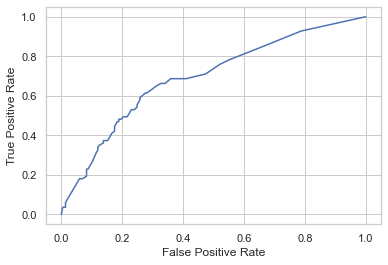

In [165]:
from sklearn import metrics
y_pred_proba =best_estim.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 4

# Bagging Classifier With Grid Search CV Hyper Parameter Tuning

In [167]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [168]:
# Model 4 Predictions

In [169]:
model4_prediction_train

,y_train,yhat
526,0.0,0.0
165,0.0,0.0
380,0.0,0.0
850,0.0,0.0
127,0.0,0.0
...,...,...
968,0.0,0.0
630,0.0,0.0
238,0.0,0.0
362,0.0,0.0


In [170]:
model4_prediction_test

,y_test,yhat
366,0.0,0.0
881,1.0,0.0
275,0.0,1.0
334,0.0,1.0
448,0.0,0.0
...,...,...
9,0.0,0.0
186,0.0,0.0
817,1.0,1.0
36,1.0,0.0


In [171]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  1.0
Test Score:  0.71
Train Accuracy Score:  1.0
Test Accuracy Score:  0.71


In [172]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 10000}
0.7971428571428572


In [173]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=10000)


In [174]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.79      0.82      0.80       217
         1.0       0.48      0.45      0.46        83

    accuracy                           0.71       300
   macro avg       0.64      0.63      0.63       300
weighted avg       0.71      0.71      0.71       300



In [175]:
print(confusion_matrix(y_test, ytst_pred3))

[[177  40]
 [ 46  37]]


In [176]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.63


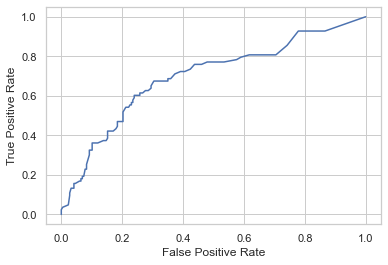

In [177]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model5

# Support Vector With Sigmoid

In [179]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [180]:
y_pred5=pd.DataFrame(clf.predict(x_train), columns=['yhat'])
print('Train Prediction\n')
y_pred5

Train Prediction



,yhat
0,1.0
1,0.0
2,1.0
3,0.0
4,0.0
...,...
695,1.0
696,0.0
697,0.0
698,1.0


In [181]:
ytst_pred5=pd.DataFrame(clf.predict(x_test), columns=['yhat'])
print('Test Prediction\n')
ytst_pred5

Test Prediction



,yhat
0,1.0
1,0.0
2,0.0
3,1.0
4,0.0
...,...
295,0.0
296,1.0
297,0.0
298,1.0


In [182]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.69
Test Score:  0.61
Train Accuracy Score:  0.69
Test Accuracy Score:  0.61
Cross Validation Score:  0.75
Cross Validation Risk:  0.0


In [183]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.71      0.77      0.74       217
         1.0       0.22      0.17      0.19        83

    accuracy                           0.61       300
   macro avg       0.47      0.47      0.47       300
weighted avg       0.57      0.61      0.59       300



In [184]:
print(confusion_matrix(y_test, ytst_pred5))

[[168  49]
 [ 69  14]]


In [185]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred5), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.47


In [186]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is off for model development.')

Graph cannot be generated because probability is off for model development.


# Resampling, Rescaling And Re Feature Selection And Re Spliting For Model Optimization

# Reasoning Of Applying Resampling and developing models 6 to 10.

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.
Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# Since, original y vector is highly unsampled, I will do resampling to balance both 1 and 0 data points to ensure that alongwith being low on variance, the model is also low on bias. Hence, I I can achieve, bias variance trade off.

# Hence, I have developed models 6 to 10 based on rfc, ensemble and svm methods on resampled data

In [187]:
y.value_counts() #original y vector, value counts

0.0    753
1.0    247
Name: fraud_reported_encoded, dtype: int64

0.0    677
1.0    677
Name: fraud_reported_encoded, dtype: int64


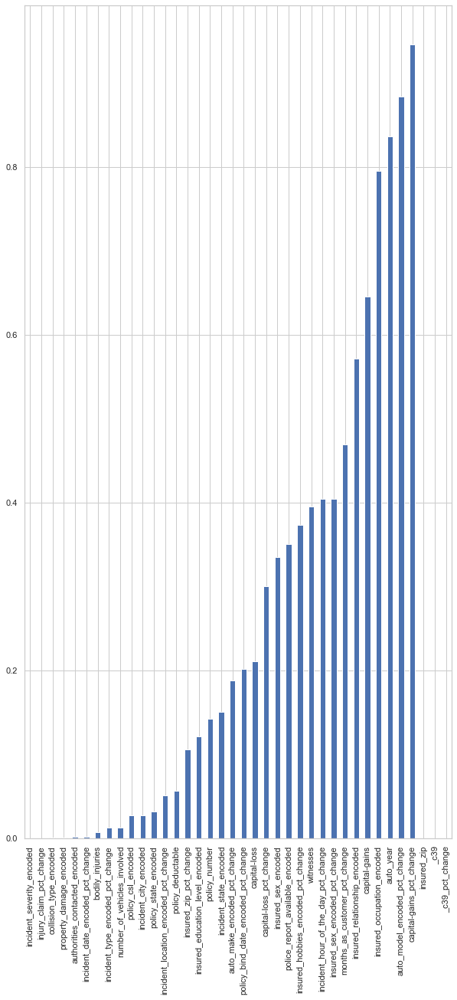

In [188]:
import numpy as np
from sklearn.utils import resample
x=x_frame11.copy()
y=final_dataframe['fraud_reported_encoded']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)
X=pd.concat([x_train, y_train], axis=1)
not_good=X[X['fraud_reported_encoded']==0]
good=X[X['fraud_reported_encoded']==1]
good_upsampled=resample(good, replace=True, n_samples=len(not_good), random_state=0)
upsampled=pd.concat([not_good, good_upsampled])
x=upsampled.drop('fraud_reported_encoded', axis=1)
y=upsampled['fraud_reported_encoded']
x[np.isinf(x)] = 0
x[np.isnan(x)]=0
scale=MinMaxScaler([0,1])
scaled_data = scale.fit_transform(x)
scaled_frame=pd.DataFrame(scaled_data, columns=x.columns)
x=scaled_frame
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x,y,test_size=0.1)
print(upsampled['fraud_reported_encoded'].value_counts())
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))
p_values=p_values[p_values<0.05]
p_values=pd.DataFrame(p_values, columns=['P Values'])
p_values['Features']=p_values.index
p_values=p_values[['Features', 'P Values']]
x=x[p_values['Features']]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)

# The above matrix represent balanced label vector with 677 data points for 0 and 677 data points for 1. And the graph shows new set of strong indicators based on p values, with variance threshold as low as 0.01 and comfidence as high as 95%.

In [189]:
p_values

,Features,P Values
incident_severity_encoded,incident_severity_encoded,2.125963e-82
injury_claim_pct_change,injury_claim_pct_change,1.968604e-04
collision_type_encoded,collision_type_encoded,3.761175e-04
property_damage_encoded,property_damage_encoded,4.105518e-04
authorities_contacted_encoded,authorities_contacted_encoded,1.386906e-03
incident_date_encoded_pct_change,incident_date_encoded_pct_change,1.982571e-03
bodily_injuries,bodily_injuries,7.198808e-03
incident_type_encoded_pct_change,incident_type_encoded_pct_change,1.224583e-02
number_of_vehicles_involved,number_of_vehicles_involved,1.284662e-02
policy_csl_encoded,policy_csl_encoded,2.736328e-02


In [190]:
x_train.sample()

,incident_severity_encoded,injury_claim_pct_change,collision_type_encoded,property_damage_encoded,authorities_contacted_encoded,incident_date_encoded_pct_change,bodily_injuries,incident_type_encoded_pct_change,number_of_vehicles_involved,policy_csl_encoded,incident_city_encoded,policy_state_encoded
338,0.0,0.551261,1.0,1.0,0.291987,0.640227,0.0,0.351709,0.870559,0.0,0.0,0.553408


In [191]:
y_train.sample()

643    1.0
Name: fraud_reported_encoded, dtype: float64

# Model 6

# RFC On Resampled Data With Intuitional Hyper Parameter Tuning

In [192]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [193]:
model1_prediction_train

,y_train,yhat
294,1.0,0.0
284,0.0,0.0
58,0.0,0.0
429,0.0,0.0
117,1.0,0.0
...,...,...
938,1.0,0.0
544,1.0,0.0
843,1.0,0.0
918,0.0,0.0


In [194]:
model1_prediction_test

,y_test,yhat
39,1.0,0.0
508,0.0,0.0
225,0.0,0.0
700,1.0,0.0
447,0.0,0.0
...,...,...
462,1.0,0.0
407,0.0,0.0
50,0.0,0.0
23,1.0,0.0


In [195]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.5
Test Score:  0.47
Train Accuracy Score:  0.5
Test Accuracy Score:  0.47
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [196]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred))
print(confusion_matrix(y_test, ytst_pred))

              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64        64
         1.0       0.00      0.00      0.00        72

    accuracy                           0.47       136
   macro avg       0.24      0.50      0.32       136
weighted avg       0.22      0.47      0.30       136

[[64  0]
 [72  0]]


In [197]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.5


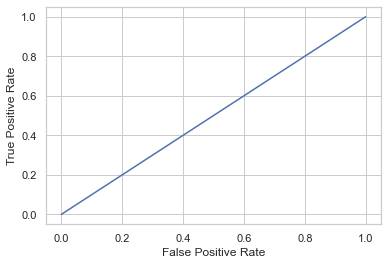

In [198]:
from sklearn import metrics
try:
    y_pred_proba =rfc.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model 7

# RFC On Resampled Data With Default Hyper Parameter Tuning

In [199]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [200]:
y_pred1

array([1., 0., 0., ..., 1., 0., 0.])

In [201]:
ytst_pred1

array([1., 0., 0., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 1., 1.,
       0., 0., 0., 0., 1., 1., 1., 1., 1., 0., 0., 0., 1., 0., 1., 1., 1.,
       1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 0., 1., 0., 0., 1., 1., 1., 1., 1., 1., 1., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 1.,
       1., 0., 0., 1., 1., 1., 0., 0., 0., 0., 1., 1., 1., 1., 0., 1., 0.,
       1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 0., 0., 0., 1., 1., 1.,
       0., 1., 0., 1., 0., 1., 1., 0., 1., 1., 1., 0., 1., 0., 0., 1., 0.])

In [202]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  1.0
Test Score:  0.93
Train Accuracy Score:  1.0
Test Accuracy Score:  0.93
Cross Validation Score:  0.92
Cross Validation Risk:  0.01


In [203]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.93


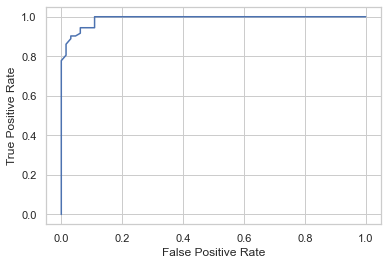

In [204]:
from sklearn import metrics
try:
    y_pred_proba =rfc1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model8

# RFC With Grid Search CV On Resampled Data

In [205]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2}) # Model 8 train prediction
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2}) # Model 8 test prediction

In [206]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  1.0
Test Score:  0.95
Train Accuracy Score:  1.0
Test Accuracy Score:  0.95


In [207]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': False, 'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'warm_start': True}
0.908031437630709


In [208]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(bootstrap=False, criterion='entropy',
                       max_features='log2', warm_start=True)


In [209]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94        64
         1.0       0.91      1.00      0.95        72

    accuracy                           0.95       136
   macro avg       0.96      0.95      0.95       136
weighted avg       0.95      0.95      0.95       136

[[57  7]
 [ 0 72]]


In [210]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.95


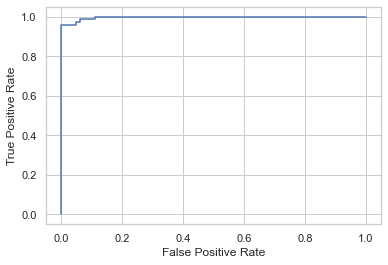

In [211]:
from sklearn import metrics
try:
    y_pred_proba =best_estim.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

In [207]:
best_model1=pickle.dumps(best_estim) #saving the model

# Model 9

# Bagging Classifier With Grid Searh CV Hyper Parameter Tuning On Resampled Data

In [212]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [213]:
model4_prediction_train

,y_train,yhat
294,1.0,1.0
284,0.0,0.0
58,0.0,0.0
429,0.0,0.0
117,1.0,1.0
...,...,...
938,1.0,1.0
544,1.0,1.0
843,1.0,1.0
918,0.0,0.0


In [214]:
model4_prediction_test

,y_test,yhat
39,1.0,1.0
508,0.0,0.0
225,0.0,0.0
700,1.0,1.0
447,0.0,0.0
...,...,...
462,1.0,1.0
407,0.0,0.0
50,0.0,0.0
23,1.0,1.0


In [215]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  1.0
Test Score:  0.93
Train Accuracy Score:  1.0
Test Accuracy Score:  0.93


In [216]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 10000}
0.8957397287998381


In [217]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=10000)


In [218]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError as err:
    print(err)

auc:  0.93


In [219]:
y_train.unique()

array([1., 0.])

In [220]:
y_test.unique()

array([1., 0.])

In [221]:
y.unique()

array([0., 1.])

In [222]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))
print(confusion_matrix(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       1.00      0.86      0.92        64
         1.0       0.89      1.00      0.94        72

    accuracy                           0.93       136
   macro avg       0.94      0.93      0.93       136
weighted avg       0.94      0.93      0.93       136

[[55  9]
 [ 0 72]]


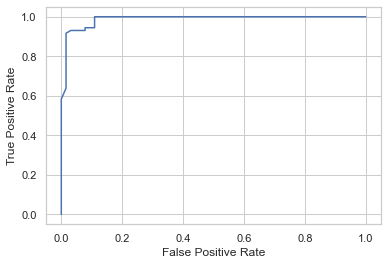

In [223]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 10

# Support Vector Classifier with sigmoid to prevent overfitting on resampled data

In [224]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [225]:
y_pred5=clf.predict(x_train)
y_pred5

array([1., 1., 0., ..., 1., 0., 1.])

In [226]:
ytst_pred5=clf.predict(x_test)
ytst_pred5

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0.,
       1., 1., 1., 1., 0., 0., 0., 1., 1., 0., 0., 1., 1., 1., 0., 0., 1.,
       0., 0., 0., 1., 1., 0., 0., 0., 0., 1., 1., 1., 1., 0., 0., 1., 1.,
       1., 1., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 0., 1.,
       0., 1., 1., 0., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 0., 0.,
       0., 0., 1., 1., 0., 1., 1., 0., 1., 1., 0., 0., 0., 1., 1., 0., 0.,
       1., 0., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 0., 1., 1., 0., 0.])

In [227]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train,y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.55
Test Score:  0.46
Train Accuracy Score:  0.55
Test Accuracy Score:  0.46
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [228]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred5))
print(confusion_matrix(y_test,ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.43      0.50      0.46        64
         1.0       0.48      0.42      0.45        72

    accuracy                           0.46       136
   macro avg       0.46      0.46      0.46       136
weighted avg       0.46      0.46      0.46       136

[[32 32]
 [42 30]]


In [229]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is turned off for model development.')

Graph cannot be generated because probability is turned off for model development.


# Best model is saved in pickle for production

# Best Model is:

# Model 8:  RFC With Grid Search CV On Resampled Data

## Train Score:  1.0

## Test Score:  0.95

## Train Accuracy Score:  1.0

## Test Accuracy Score:  0.95

## auc:  0.95

# Credits:
DataTrained and Python Documentations.